In [1]:
%matplotlib inline
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import ast

In [2]:
tweets = pd.read_csv('Tweets.csv')

In [3]:
tweet_locs = tweets.dropna(subset=['tweet_coord'])
tweet_locs.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
21,570264145116819457,positive,1.000,NaN,NaN,Virgin America,NaN,DT_Les,NaN,0,@VirginAmerica I love this graphic. http://t.c...,"[40.74804263, -73.99295302]",2015-02-24 08:49:01 -0800,NaN,NaN
28,570207886493782019,negative,1.000,Bad Flight,1.0,Virgin America,NaN,blackjackpro911,NaN,0,@VirginAmerica amazing to me that we can't get...,"[42.361016, -71.02000488]",2015-02-24 05:05:28 -0800,"San Mateo, CA & Las Vegas, NV",NaN
29,570124596180955136,neutral,0.615,NaN,0.0,Virgin America,NaN,TenantsUpstairs,NaN,0,@VirginAmerica LAX to EWR - Middle seat on a r...,"[33.94540417, -118.4062472]",2015-02-23 23:34:30 -0800,Brooklyn,Atlantic Time (Canada)
32,570088404156698625,negative,1.000,Customer Service Issue,1.0,Virgin America,NaN,Cuschoolie1,NaN,0,"@VirginAmerica help, left expensive headphones...","[33.94209449, -118.40410103]",2015-02-23 21:10:41 -0800,Washington DC,Quito
34,570076792993611776,positive,1.000,NaN,NaN,Virgin America,NaN,NorthTxHomeTeam,NaN,0,@VirginAmerica this is great news! America co...,"[33.2145038, -96.9321504]",2015-02-23 20:24:33 -0800,Texas,Central Time (US & Canada)


In [4]:
positive = tweet_locs[tweet_locs['airline_sentiment'] == 'positive']

In [5]:
negative = tweet_locs[tweet_locs['airline_sentiment'] == 'negative']

In [6]:
#testing using 'ast' module to convert string representation of list to an actual list. 
x = []
y = []
for i in positive['tweet_coord']:
    y.append(ast.literal_eval(i)[0])
for i in positive['tweet_coord']:
    x.append(ast.literal_eval(i)[1])
    
x1 = []
y1 = []
for i in negative['tweet_coord']:
    y1.append(ast.literal_eval(i)[0])
for i in negative['tweet_coord']:
    x1.append(ast.literal_eval(i)[1])

In [7]:
posx = []
posy = []
for i in positive.tweet_coord.map(lambda x : eval(x)[0]):
    posy.append(i)
for i in positive.tweet_coord.map(lambda x : eval(x)[1]):
    posx.append(i)

In [8]:
negx = []
negy = []
for i in negative.tweet_coord.map(lambda x : eval(x)[0]):
    negy.append(i)
for i in negative.tweet_coord.map(lambda x : eval(x)[1]):
    negx.append(i)

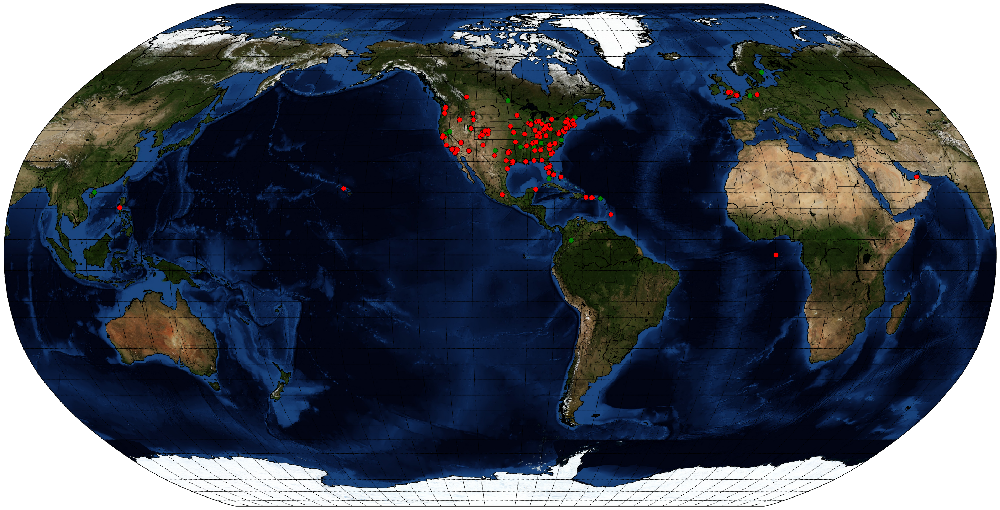

In [9]:
fig, ax = plt.subplots(figsize=(36,20))

my_map = Basemap(projection='robin', lat_0=0, lon_0=-100,
              resolution='l', area_thresh=1000.0)

#my_map = Basemap(projection='merc', lat_0=40, lon_0=-100,
#                resolution='h',llcrnrlon=-127, llcrnrlat=24, urcrnrlon=-65, urcrnrlat=50)

my_map.drawcoastlines()
my_map.drawcountries()
my_map.drawstates()
#my_map.drawlsmask(land_color='green', ocean_color='blue')
#my_map.fillcontinents(lake_color="blue")
my_map.bluemarble()
#my_map.etopo()
#my_map.shadedrelief()
my_map.drawmeridians(np.arange(0, 360, 10))
my_map.drawparallels(np.arange(-90, 90, 5))



a,b = my_map(x, y)
my_map.plot(a, b, 'go', markersize=10)

c,d = my_map(x1, y1)
my_map.plot(c, d, 'ro', markersize = 10)

plt.show()

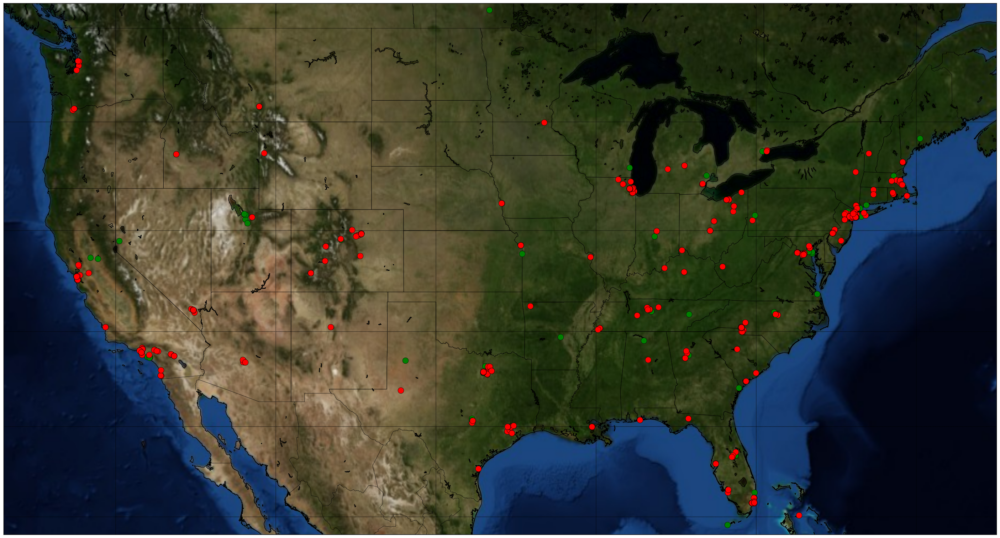

In [10]:
fig, ax = plt.subplots(figsize=(36,20))

#my_map = Basemap(projection='robin', lat_0=0, lon_0=-100,
#              resolution='l', area_thresh=1000.0)

my_map = Basemap(projection='merc', lat_0=40, lon_0=-100,
                resolution='h',llcrnrlon=-127, llcrnrlat=24, urcrnrlon=-65, urcrnrlat=50)

my_map.drawcoastlines()
my_map.drawcountries()
my_map.drawstates()
#my_map.drawlsmask(land_color='green', ocean_color='blue')
#my_map.fillcontinents(lake_color="blue")
my_map.bluemarble()
#my_map.etopo()
#my_map.shadedrelief()
my_map.drawmeridians(np.arange(0, 360, 10))
my_map.drawparallels(np.arange(-90, 90, 5))



a,b = my_map(x, y)
my_map.plot(a, b, 'go', markersize= 12)

c,d = my_map(x1, y1)
my_map.plot(c, d, 'ro', markersize = 12)

plt.show()